In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import sys
import os
from datetime import datetime
import scipy.stats as st
import json

import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.offline import plot
from sklearn.decomposition import PCA

import json
sys.path.insert(1, '../')
import lib.pe_down_loading_data_frame as loader
import lib.pe_utils as utils
import lib.pe_model as model
import lib.pe_config as conf
import lib.pe_df_analyzer as analyzer
import lib.pe_varmaker as va_m
import lib.pe_df_writer as writer
import lib.pe_metrics as metrics
'''
import lib.pe_preprocessing as prepro
import lib.pe_df_reader as reader
'''

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.covariance import EllipticEnvelope

# Скачаем данные 

In [2]:
dots = 5
two_week = 60 * 24 * 7 * 2
get_var = True
step = '1m'
dc_period = {'au2-acs1': ['01/01/2020 00:01', '29/02/2020 00:01'],
             'us6-acs2': ['01/01/2020 00:01', '29/02/2020 00:01'],
             'eu3-acs1': ['01/01/2020 00:01', '29/02/2020 00:01'],
             'us3': ['01/01/2020 00:01', '29/02/2020 00:01'],
            }

def load_model_data(dc, inst, start_time, end_time, dots, pri=True):
    st_time = start_time.replace(" ", "").replace("/", "").replace(":", "")
    en_time = end_time.replace(" ", "").replace("/", "").replace(":", "")
    if pri:
        print(f'\nmodel:\nDC={dc}\nINSTANCE={inst}')
    data_file_name = utils.get_file_name(kind=f'for_model/data_model', dc=dc, inst_num=inst,
                                             st_time=st_time, en_time=en_time, dots=dots
                                            )
    if not os.path.isfile(f'../datasets/{data_file_name}.csv'):
        instance = utils.get_instance_for_dc(dc, inst)
        querys = utils.get_querys(dc, instance)
        data_file_name = utils.get_file_name(kind=f'for_model/data_model', dc=dc, inst_num=inst,
                                             st_time=st_time, en_time=en_time, dots=dots
                                            )
        
        df = utils.get_data_with_date(start_time=start_time, finish_time=end_time, dc=dc,
                                        querys=querys, inst_num=inst, step='1m', dots=5,
                                        data_file_name=data_file_name, 
                                       )
    else:
        if pri:
            print('\tdata for model is already loaded')
    return f'../datasets/{data_file_name}.csv'

def load_var_data(dc, inst, start_time, end_time, dots, pri=True):
    st_time = start_time.replace(" ", "").replace("/", "").replace(":", "")
    en_time = end_time.replace(" ", "").replace("/", "").replace(":", "")
    if pri:
        print(f'\nvar:\nDC={dc}\nINSTANCE={inst}')
    var_file_name = utils.get_file_name(kind=f'for_variance/var_data', dc=dc, inst_num=inst,
                                        st_time=st_time, en_time=en_time, dots=dots)
    if not os.path.isfile(f'../datasets/{var_file_name}.csv'):
        instance = utils.get_instance_for_dc(dc, inst_num)
        #if not os.path.isfile(var_file_name)
        bucket_query = 'abgw_iop_latency_ms_bucket{dc="' + dc + '"' + ', err="OK", iop="pread", instance="' 
        bucket_query += instance + '", proxied = "0"}'
        metric_start = "abgw_iop_latency_ms_bucket_dc=" + dc + "_err=OK_instance=" + instance
        metric_start += "_iop=pread_job=abgw_le="
        var_df = loader.get_normalized_time_series(query=bucket_query, finish=end_time, start=start_time,
                                                   step=step)
        var_df.to_csv(f'../datasets/{var_file_name}.csv')
    else:
        if pri:
            print('\tvar data already loaded')
    return f'../datasets/{var_file_name}.csv'

In [3]:
for dc in dc_period:
    for inst_num in conf.get_inst_range_for_dc(dc):
        start_time = dc_period[dc][0]
        end_time = dc_period[dc][1]
        
        load_model_data(dc, inst_num, start_time, end_time, dots)
        load_var_data(dc, inst_num, start_time, end_time, dots)


model:
DC=au2-acs1
INSTANCE=1
	data for model is already loaded

var:
DC=au2-acs1
INSTANCE=1
	var data already loaded

model:
DC=au2-acs1
INSTANCE=2
	data for model is already loaded

var:
DC=au2-acs1
INSTANCE=2
	var data already loaded

model:
DC=au2-acs1
INSTANCE=3
	data for model is already loaded

var:
DC=au2-acs1
INSTANCE=3
	var data already loaded

model:
DC=au2-acs1
INSTANCE=4
	data for model is already loaded

var:
DC=au2-acs1
INSTANCE=4
	var data already loaded

model:
DC=au2-acs1
INSTANCE=5
	data for model is already loaded

var:
DC=au2-acs1
INSTANCE=5
	var data already loaded

model:
DC=au2-acs1
INSTANCE=6
	data for model is already loaded

var:
DC=au2-acs1
INSTANCE=6
	var data already loaded

model:
DC=au2-acs1
INSTANCE=7
	data for model is already loaded

var:
DC=au2-acs1
INSTANCE=7
	var data already loaded

model:
DC=au2-acs1
INSTANCE=8
	data for model is already loaded

var:
DC=au2-acs1
INSTANCE=8
	var data already loaded

model:
DC=au2-acs1
INSTANCE=9
	data for model i

In [4]:
train_size = 60 * 24 * 7 * 2
for dc in dc_period: 
    for inst_num in conf.get_inst_range_for_dc(dc):
        instance = utils.get_instance_for_dc(dc, inst_num)
        print(f'\nDC={dc}\nINSTANCE={instance}')
        start_time = dc_period[dc][0]
        end_time = dc_period[dc][1]
        
        st_time = start_time.replace(" ", "").replace("/", "").replace(":", "")
        en_time = end_time.replace(" ", "").replace("/", "").replace(":", "")
        
        out_file_name = 'for_plot/'
        out_file_name += utils.get_file_name(kind=f'simpleLR__train={train_size}__dots={dots}',
                                            dc=dc, inst_num=inst_num, st_time=st_time, en_time=en_time, 
                                            dots=dots)
       
            
        data_file_name = load_model_data(dc, inst_num, st_time, en_time, dots, pri=False)

        # and data
        data = pd.read_csv(data_file_name)
        data.dropna(inplace=True)
        train_data = data[:train_size]
        break
     
    break 


DC=au2-acs1
INSTANCE=au2-acs1-stor01.vstoragedomain


# Рассмотрим данные подробнее 

Добавим столбец с производной и с датой 

In [5]:
train_data['target_div'] = train_data['target'].diff()
train_data['date'] = train_data['time_stamp'].apply(lambda x: datetime.fromtimestamp(x))

In [6]:
fig = make_subplots(rows = 1, cols=1)
fig.add_trace(go.Scatter(x=train_data['date'], y=train_data['target']), row = 1 , col = 1)
fig.update_layout(height=500, width=700, title_text = 'dc = ' + dc+' inst_n = '+ str(inst_num), xaxis_title="Date",
yaxis_title="Target")
fig.show()

In [7]:
fig = make_subplots(rows = 1, cols=1)
fig.add_trace(go.Scatter(x=train_data['date'], y=train_data['target_div']), row = 1 , col = 1)
fig.update_layout(height=500, width=700, title_text = 'dc = ' + dc+' inst_n = '+ str(inst_num), xaxis_title="Date",
yaxis_title="Derivative of target")
fig.show()

In [8]:
max_index = train_data[train_data['target_div'] == train_data['target_div'].max()].index[0]

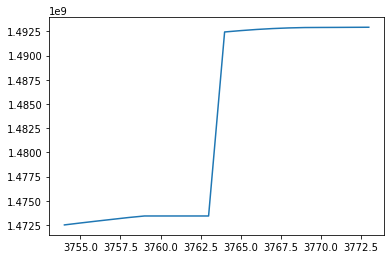

In [9]:
plt.plot(train_data['target'][max_index-10:max_index+10])

В данных обнаружили выброс. Если отдельный экземпляр данных можно рассматривать как аномальный по отношению к остальным данным, мы называем его точечной аномалией. Пока выкинем его

In [10]:
train_data.drop(train_data[train_data['target_div'] == train_data['target_div'].max()].index[0], inplace=True)

In [11]:
fig = make_subplots(rows = 1, cols=1)
fig.add_trace(go.Scatter(x=train_data['date'], y=train_data['target_div']), row = 1 , col = 1)
fig.update_layout(height=500, width=700, title_text = 'dc = ' + dc+' inst_n = '+ str(inst_num), xaxis_title="Date",
yaxis_title="Derivative of target")
fig.show()

Гистгорамма для производной таргета

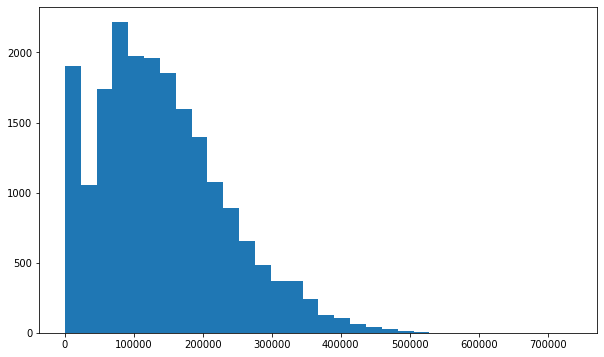

In [12]:
fig, axs = plt.subplots(figsize=(10,6))
axs.hist(train_data['target_div'], bins = 32)
plt.show()

# Gaussian Distribution 

In [38]:
outliers_fraction = 0.0025

In [39]:
df = train_data['target_div']
df.dropna()

envelope =  EllipticEnvelope(contamination = outliers_fraction) 
X_train = df.values.reshape(-1,1)
envelope.fit(X_train)
df = pd.DataFrame(df)
df['deviation'] = envelope.decision_function(X_train)
df['anomaly'] = envelope.predict(X_train)

In [40]:
data = pd.DataFrame(train_data)
data.dropna()
data.drop(0, inplace = True)
df['date'] = data['date']

In [41]:
df['anomaly'].value_counts()

 1    20107
-1       51
Name: anomaly, dtype: int64

In [42]:
anomalies = df.loc[df['anomaly'] == -1, ('date', 'target_div')]

In [43]:
fig = make_subplots(rows = 1, cols=1)
fig.add_trace(go.Scatter(x=df['date'], y=df['target_div'], name = 'Normal'), row = 1 , col = 1)
fig.add_trace(go.Scatter(x=anomalies['date'], y=anomalies['target_div'], name = 'Anomaly', mode='markers'), row = 1 , col = 1)

fig.update_layout(height=500, width=700, title_text = 'dc = ' + dc+' inst_n = '+ str(inst_num), xaxis_title="Date",
yaxis_title="Derivative of target")
fig.show()

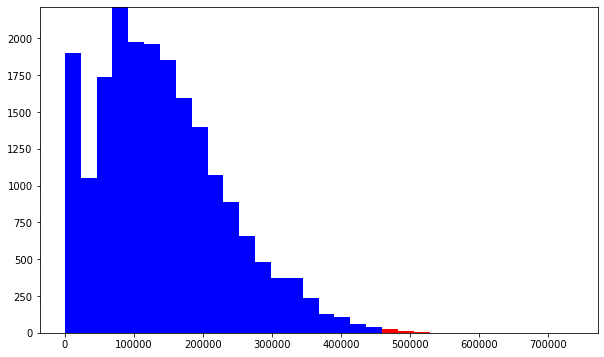

In [44]:
a = df.loc[df['anomaly'] == 1, 'target_div']
b = df.loc[df['anomaly'] == -1, 'target_div']

fig, axs = plt.subplots(figsize=(10,6))
axs.hist([a,b], bins=32, stacked=True, color=['blue', 'red'])
plt.show();